# Preparação do ambiente

## Bibliotecas

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re
import unidecode

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from string import punctuation

from functions import plot_docs_matrix, plot_wordcloud

## Constantes e funções auxiliares

In [2]:
def tokenizer(doc):
    doc = doc.lower()
    doc = unidecode.unidecode(doc)
    
    patterns = [('wi\s?.?fi', 'wifi'), 
                ('2,4', '2.4'), 
                ('5,8', '5.8')]
    for pattern, repl in patterns:
        doc = re.sub(pattern, repl, doc)
    
    stop_words = stopwords.words('portuguese')
    stop_words.extend(stopwords.words('english'))
    stop_words.extend(list(punctuation))
    # stopwords específicas do domínio
    stop_words.extend(['cm', 'feature', 'features', 'informações', 'itens', 'leve', 'list', 'nulo', 'package', 'pacote', 'pacotes', 'recurso', 'tamanho', 'ver', 'unidades'])
    # cores mais comumns
    stop_words.extend(['preto', 'cinza', 'branco', 'rosa', 'vermelho', 'laranja', 'amarelo', 'verde', 'azul', 'roxo', 'marrom'])
    # remover da lista de stopwords a palavra sem para formar o bigrama "sem fio", que pode ser relevante para o domínio
    stop_words.remove('sem') 
    
    tokens = [token for token in word_tokenize(doc) if token not in stop_words]
    return tokens

def doc_cleaner(doc):
    tokens = tokenizer(doc)
    return ' '.join(tokens) 

# Carga e prepação dos dados

In [3]:
file_cat_sample = '../datasets/cat_to_label_sample.xlsx'
df_cat_sample = pd.read_excel(file_cat_sample)

df_cat_sample = df_cat_sample.iloc[:,-2:]
df_cat_sample = df_cat_sample.dropna()
df_cat_sample.columns = ['doc', 'labeled_category']

map_telecom_product = {'Antena': 1,  
                       'Baterias (eletrônicos em geral)': 0, 
                       'Cabo (em geral)': 0, 
                       'Cabo de rede': 1, 
                       'Câmera sem fio': 1, 
                       'Carregador de celular': 1,
                       'Carregador portátil (powerbank)': 1,
                       'Carregador sem fio': 1, 
                       'Carregadores e fontes (eletrônicos em geral)': 0, 
                       'Cartão de memória': 0,
                       'Desktop/Notebook': 0, 
                       'Drone': 1, 
                       'Extensor de vídeo VGA/HDMI': 0, 
                       'Fone de ouvido sem fio': 1, 
                       'Hub Switch': 1, 
                       'Impressora e cartuchos': 0,
                       'Microfone sem fio': 1, 
                       'Modem 3G/4G/WiFi': 1, 
                       'Outros': 0, 
                       'Reforçador de sinal de celular': 1, 
                       'Roteador/Reforçador WiFi': 1, 
                       'Smart TV': 1,
                       'Smartwatch': 1, 
                       'Tablets': 1, 
                       'Telefone celular': 1, 
                       'Transceptor de Radiação Restrita': 1, 
                       'Transceptor de RF (HF/VHF/UHF)': 1, 
                       'Transceptor/Conversor SFP': 1, 
                       'TV Box': 1}

map_rf_transmitter = {'Antena': 1,  
                      'Baterias (eletrônicos em geral)': 0, 
                      'Cabo (em geral)': 0, 
                      'Cabo de rede': 1, 
                      'Câmera sem fio': 2, 
                      'Carregador de celular': 1,
                      'Carregador portátil (powerbank)': 1,
                      'Carregador sem fio': 1, 
                      'Carregadores e fontes (eletrônicos em geral)': 0, 
                      'Cartão de memória': 0,
                      'Desktop/Notebook': 0, 
                      'Drone': 2, 
                      'Extensor de vídeo VGA/HDMI': 0, 
                      'Fone de ouvido sem fio': 2, 
                      'Hub Switch': 1, 
                      'Impressora e cartuchos': 0,
                      'Microfone sem fio': 2, 
                      'Modem 3G/4G/WiFi': 2, 
                      'Outros': 0,                        
                      'Reforçador de sinal de celular': 2, 
                      'Roteador/Reforçador WiFi': 2, 
                      'Smart TV': 2,
                      'Smartwatch': 2, 
                      'Tablets': 2, 
                      'Telefone celular': 2, 
                      'Transceptor de Radiação Restrita': 2, 
                      'Transceptor de RF (HF/VHF/UHF)': 2, 
                      'Transceptor/Conversor SFP': 1, 
                      'TV Box': 2}

df_cat_sample['telecom_product'] = df_cat_sample['labeled_category'].map(map_telecom_product)
df_cat_sample['rf_transmitter'] = df_cat_sample['labeled_category'].map(map_rf_transmitter)

map_category_to_int = {category:i for i,category in enumerate(df_cat_sample.labeled_category.unique())}
map_category_to_name = {i:category for category,i in map_category_to_int.items()}
df_cat_sample['category'] = df_cat_sample['labeled_category'].map(map_category_to_int)

df_cat_sample['clean_doc'] = df_cat_sample.doc.map(doc_cleaner)
columns_to_keep = ['doc', 'clean_doc', 'labeled_category', 'telecom_product', 'rf_transmitter', 'category']
df_cat_sample = df_cat_sample[columns_to_keep]

df_cat_sample

D:\Users\maxwelfreitas\AppData\Local\anaconda3\envs\certificacao\lib\site-packages\openpyxl\worksheet\_read_only.py:81: UserWarning: Data Validation extension is not supported and will be removed
  for idx, row in parser.parse():


,doc,clean_doc,labeled_category,telecom_product,rf_transmitter,category
0,"Antena WiFi omnidirecional 2 peças, antena 4DB...",antena wifi omnidirecional 2 pecas antena 4dbi...,Antena,1,1,0
1,"Kesoto 2 peças macho 2,4 GHz 5 Ghz 5,8 Ghz ant...",kesoto 2 pecas macho 2.4 ghz 5 ghz 5.8 ghz ant...,Antena,1,1,0
2,Hemobllo Antenas 5 Unidades módulo transceptor...,hemobllo antenas 5 modulo transceptor sem fio ...,Antena,1,1,0
3,3 peças placa de rede sem fio WiFi antena rote...,3 pecas placa rede sem fio wifi antena roteado...,Antena,1,1,0
4,Angoily 2 Unidades Substituição Da Antena Bast...,angoily 2 substituicao antena bastoes cola rec...,Antena,1,1,0
...,...,...,...,...,...,...
2086,Gps para Bike Xoss G Bluetooth Mtb Speed,gps bike xoss g bluetooth mtb speed,Transceptor de Radiação Restrita,1,2,25
2087,"Módulo AUX Bluetooth para carro, 11Pin Bluetoo...",modulo aux bluetooth carro 11pin bluetooth 5.0...,Transceptor de Radiação Restrita,1,2,25
2088,Operitacx Batente De Porta Protetor De Parada ...,operitacx batente porta protetor parada piso p...,Outros,0,0,18
2089,"Tecido de Faraday de 43 x 39 polegadas, tecido...",tecido faraday 43 x 39 polegadas tecido farada...,Outros,0,0,18


In [4]:
df_categories = df_cat_sample.pivot_table(index=['labeled_category','category'], columns='rf_transmitter', values='doc', aggfunc='count').fillna(0).astype('int')
df_categories['total'] = df_categories.sum(axis=1)
df_categories = df_categories.sort_values(by='total',ascending=False)
df_categories.loc['total'] = df_categories.sum()
df_categories

rf_transmitter,0,1,2,total
"(Outros, 18)",943,0,0,943
"(Transceptor de Radiação Restrita, 25)",0,0,599,599
"(Cabo (em geral), 2)",89,0,0,89
"(Transceptor de RF (HF/VHF/UHF), 26)",0,0,48,48
"(Microfone sem fio, 16)",0,0,38,38
"(Fone de ouvido sem fio, 13)",0,0,30,30
"(Desktop/Notebook, 10)",30,0,0,30
"(Carregadores e fontes (eletrônicos em geral), 8)",27,0,0,27
"(Carregador de celular, 5)",0,26,0,26
"(Câmera sem fio, 4)",0,0,26,26


# Análise

## Palavras mais frequentes por categoria

Categoria: Outros


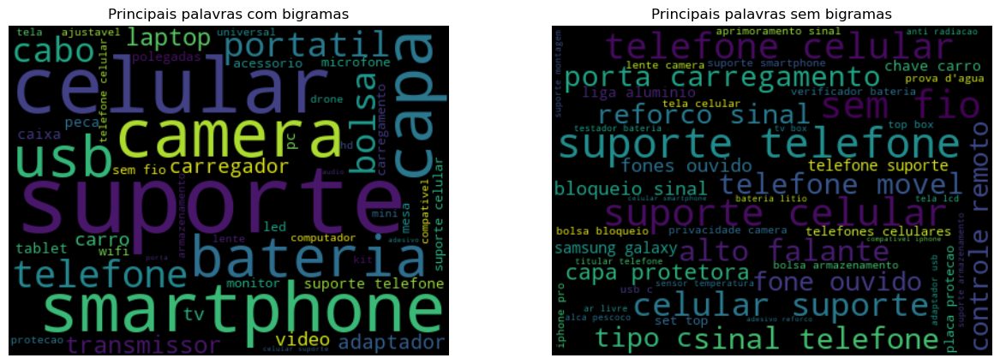

Categoria: Transceptor de Radiação Restrita


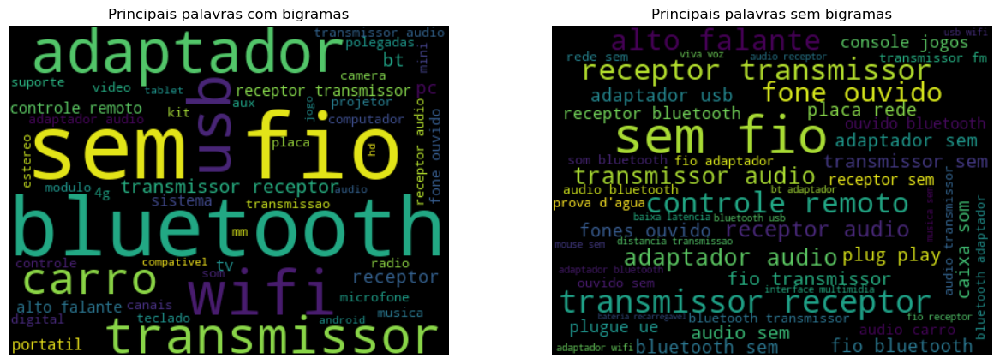

Categoria: Cabo (em geral)


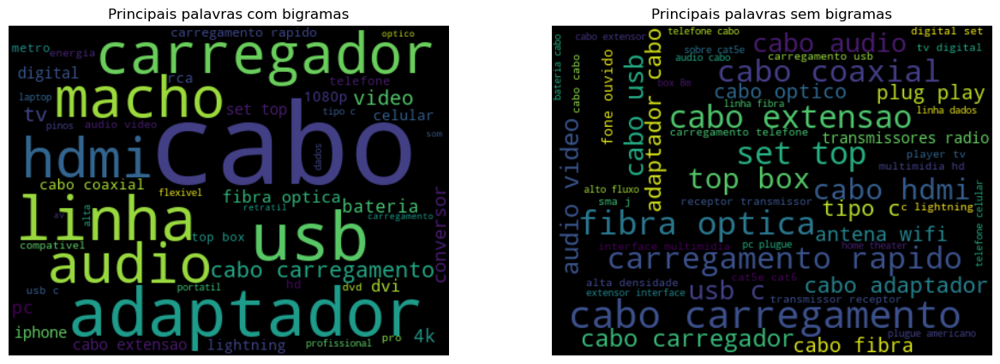

Categoria: Transceptor de RF (HF/VHF/UHF)


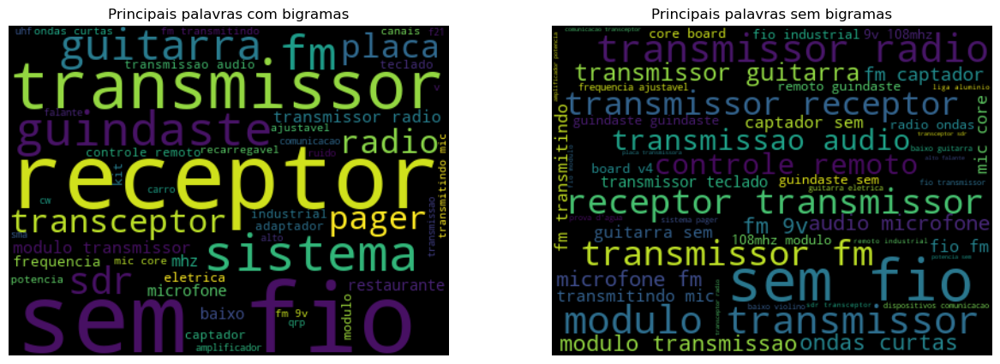

Categoria: Microfone sem fio


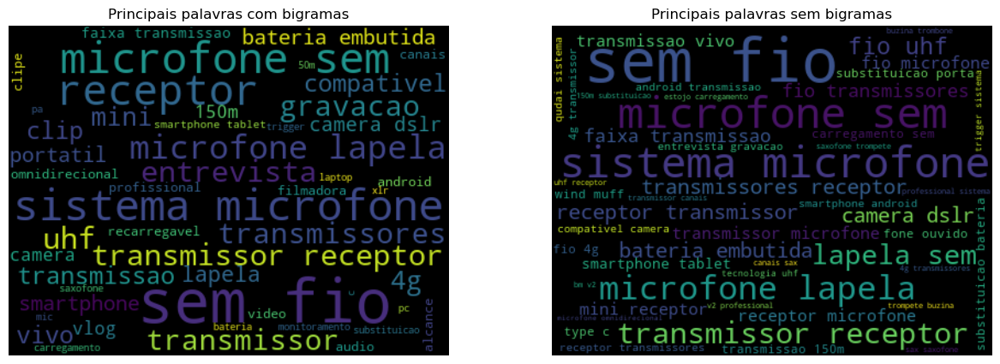

Categoria: Desktop/Notebook


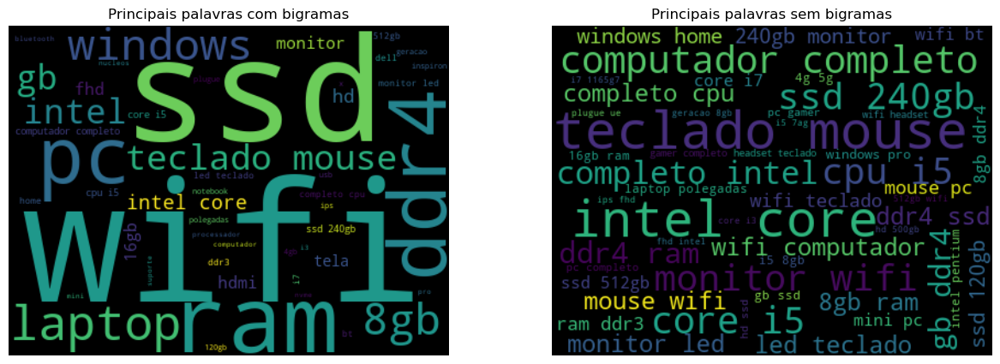

Categoria: Fone de ouvido sem fio


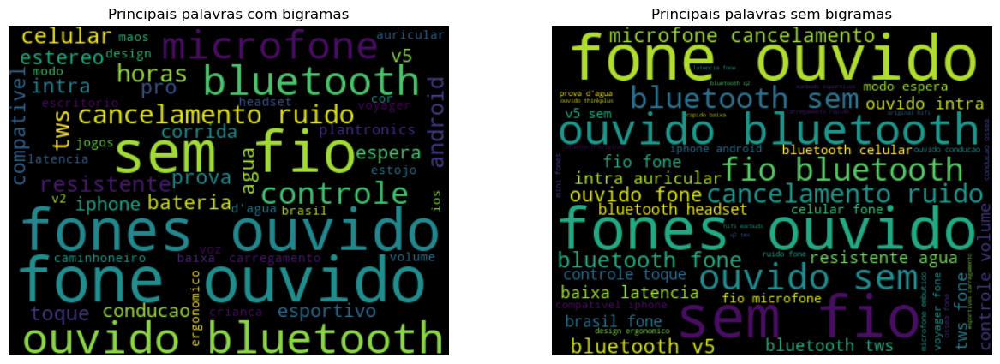

Categoria: Carregadores e fontes (eletrônicos em geral)


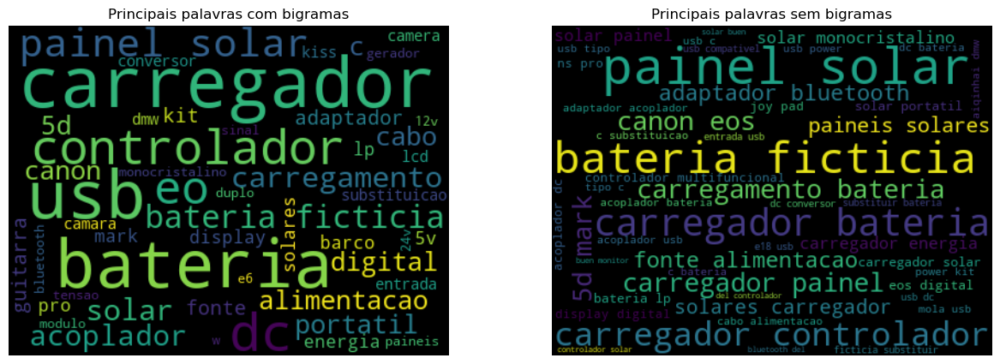

Categoria: Câmera sem fio


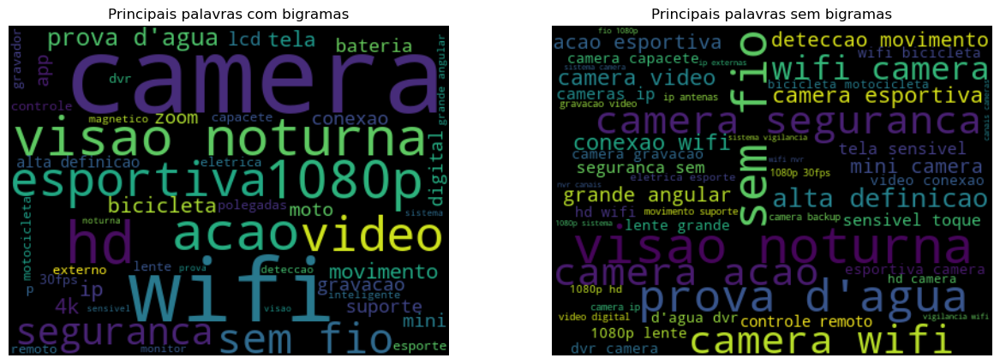

Categoria: Carregador de celular


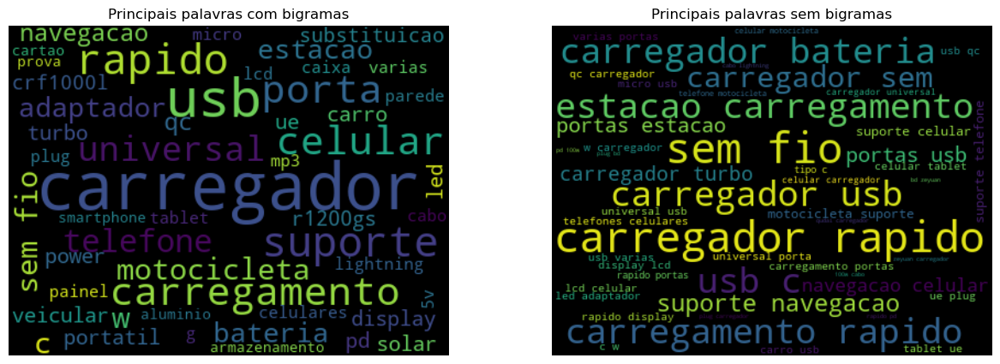

Categoria: Roteador/Reforçador WiFi


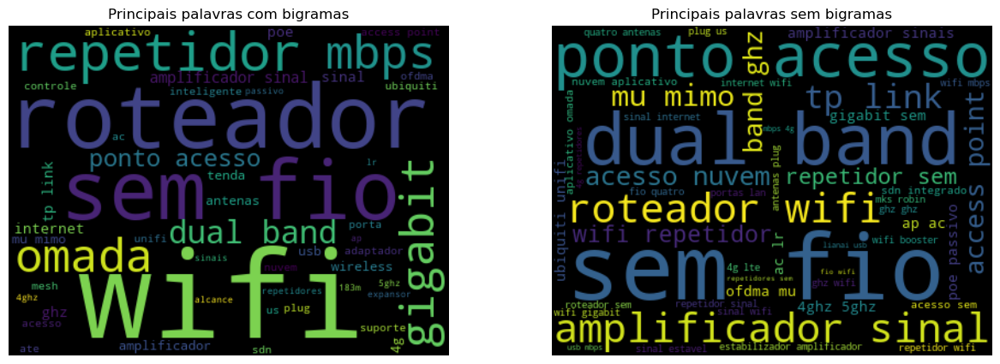

Categoria: Impressora e cartuchos


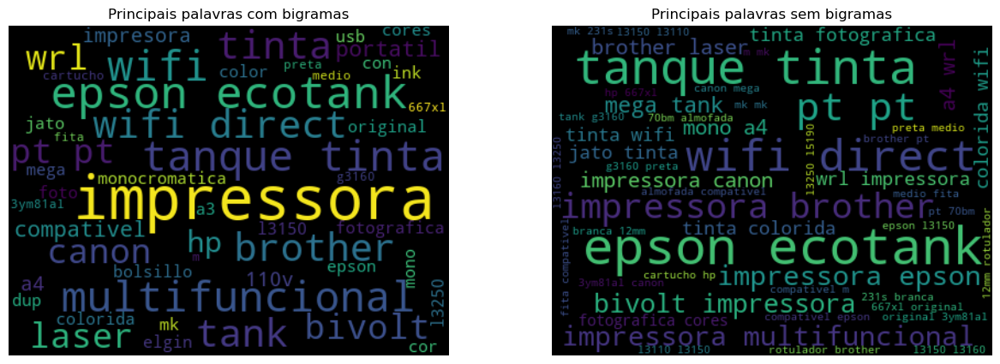

Categoria: Antena


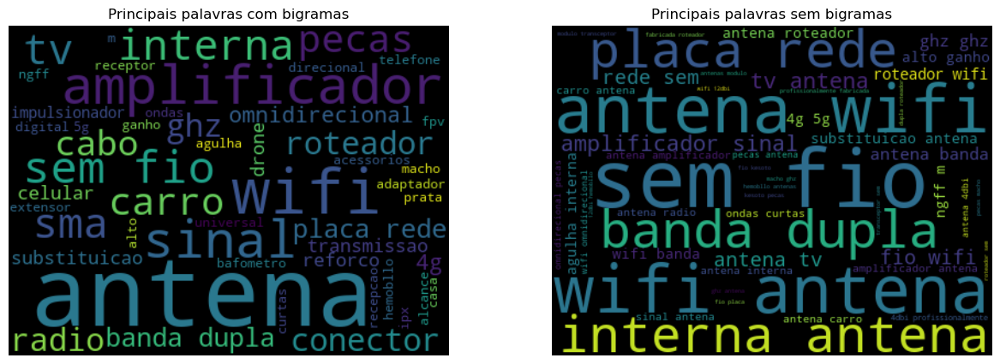

Categoria: Baterias (eletrônicos em geral)


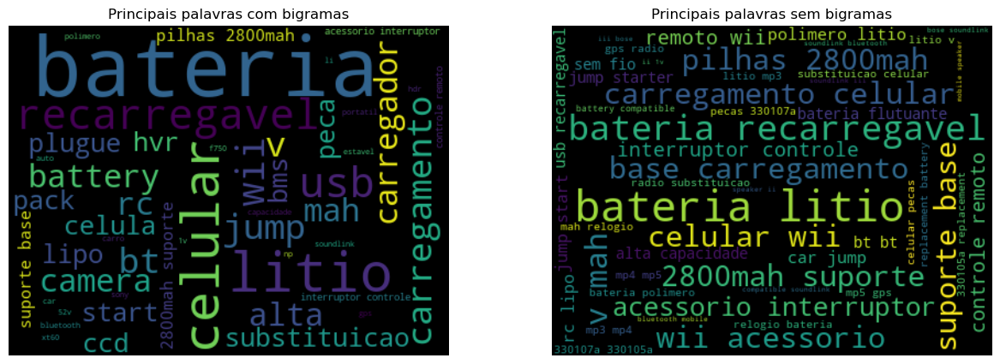

Categoria: Extensor de vídeo VGA/HDMI


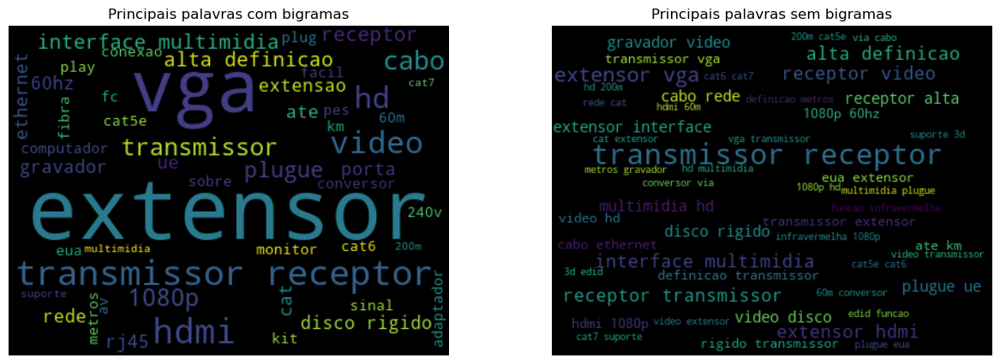

Categoria: Tablets


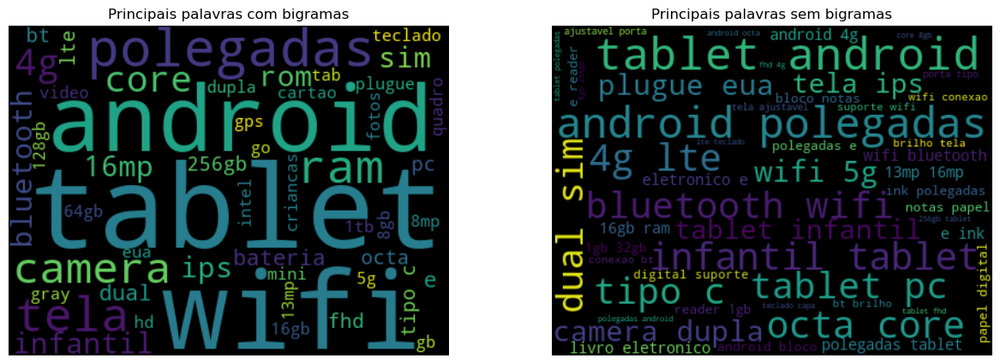

Categoria: Transceptor/Conversor SFP


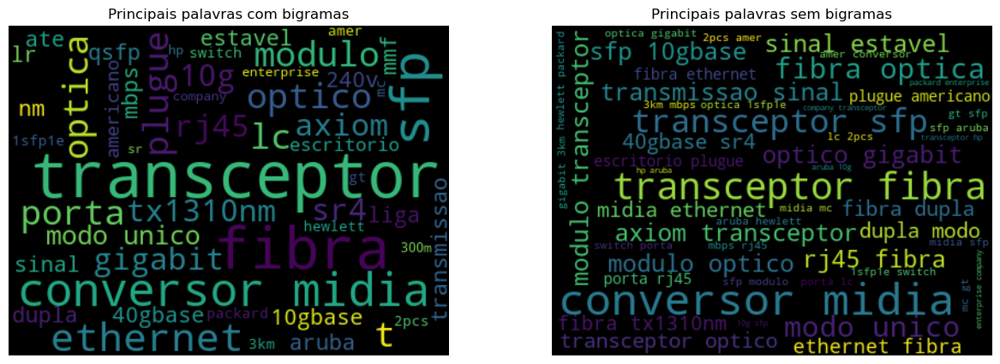

Categoria: Telefone celular


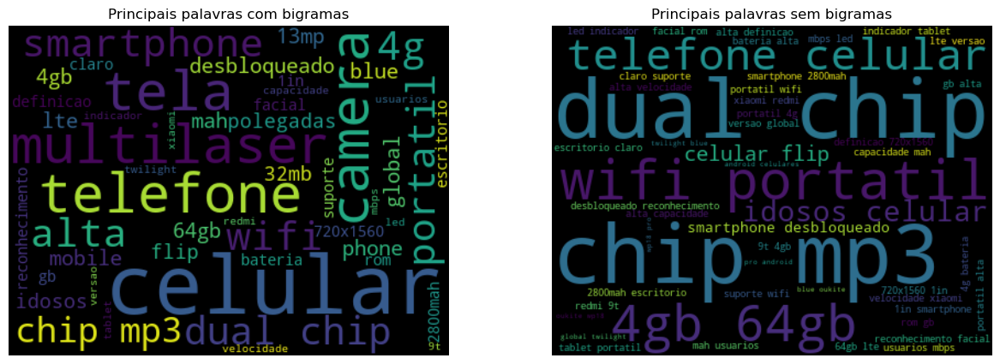

Categoria: Carregador sem fio


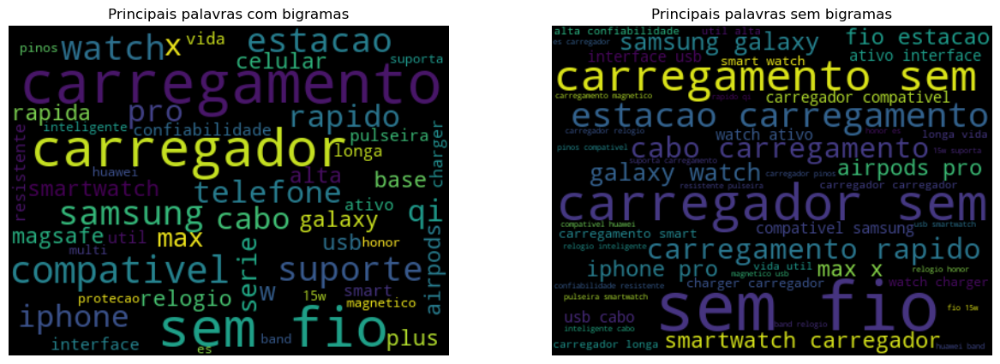

Categoria: Cartão de memória


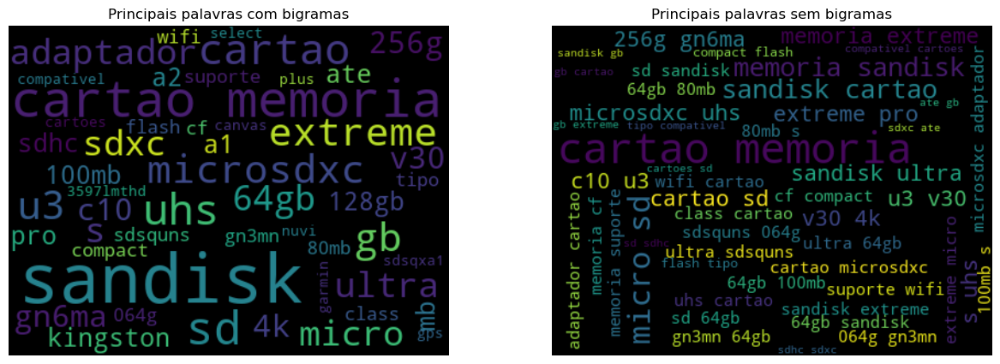

Categoria: Drone


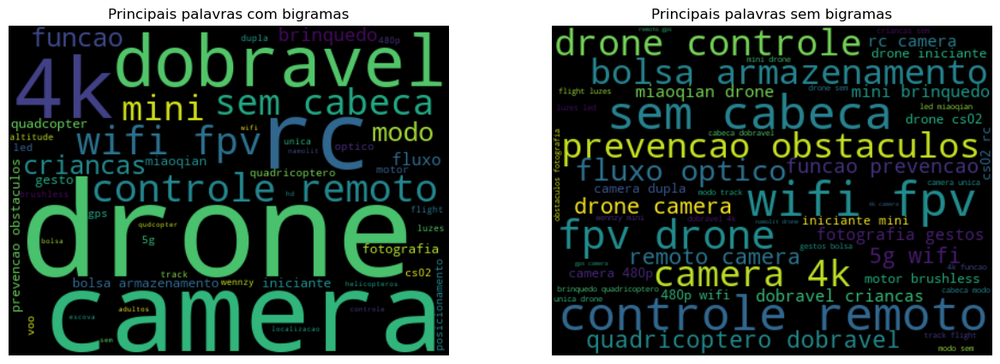

Categoria: Smartwatch


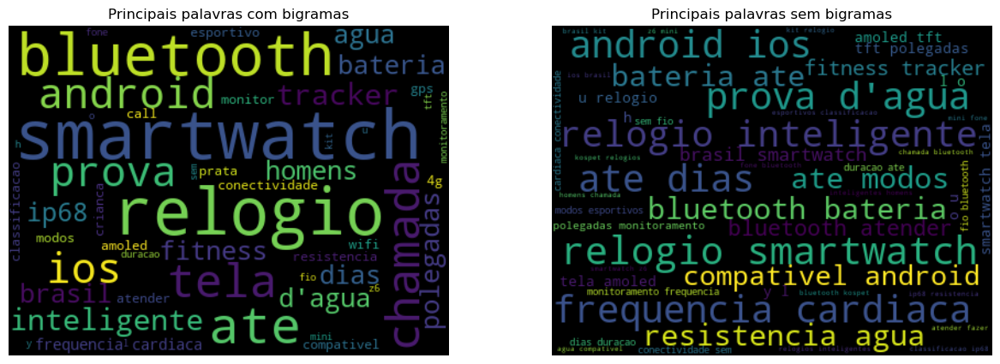

Categoria: Carregador portátil (powerbank)


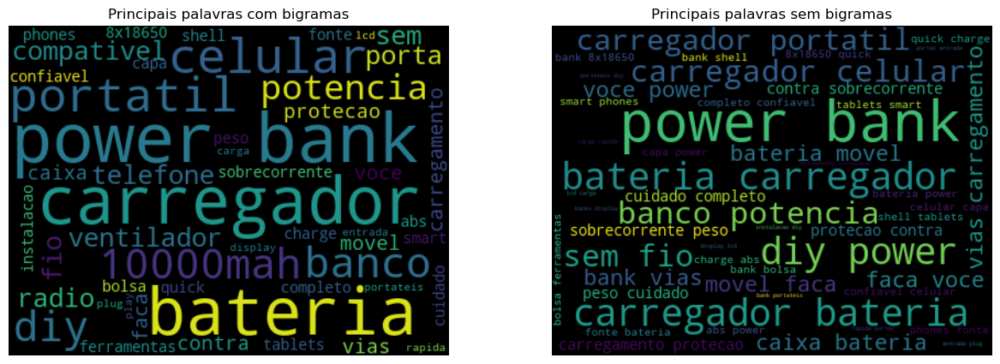

Categoria: Cabo de rede


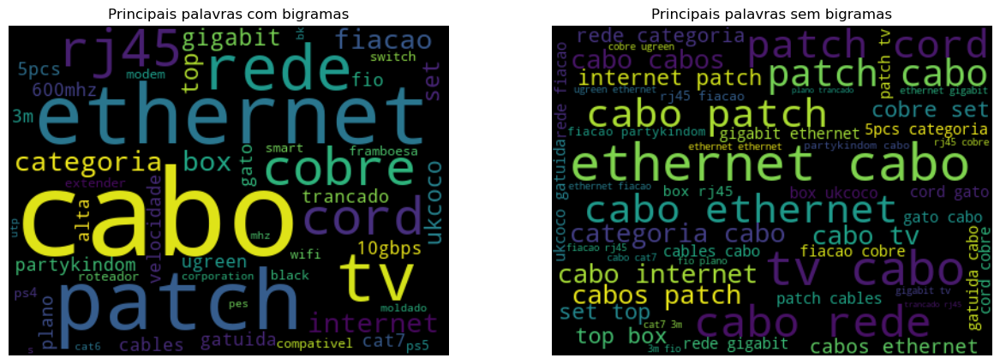

Categoria: Reforçador de sinal de celular


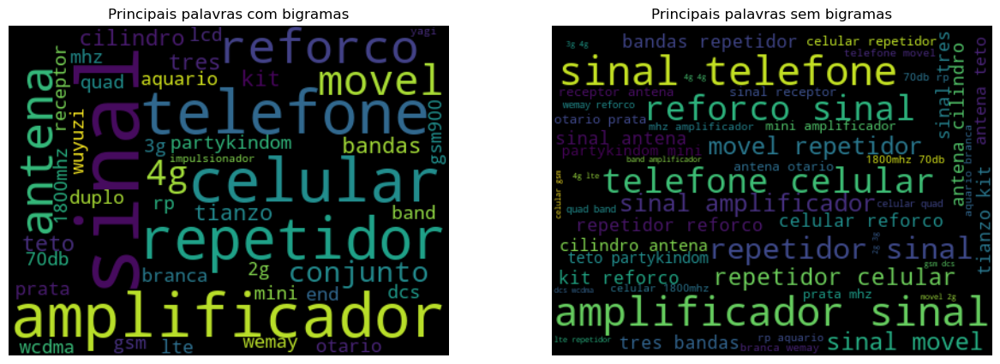

Categoria: Smart TV


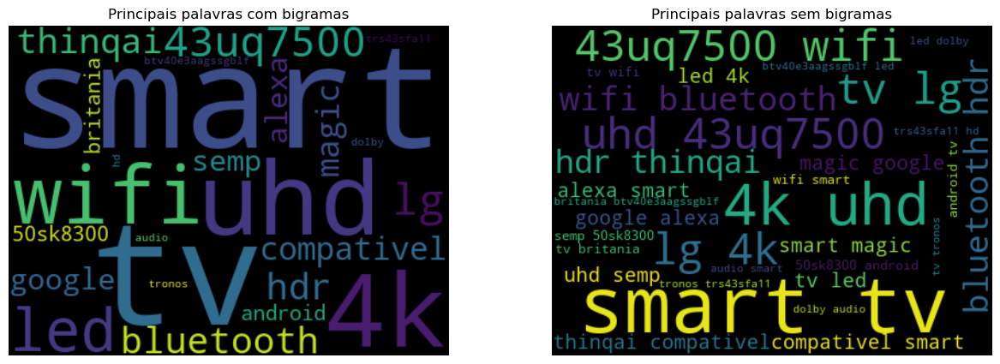

Categoria: Hub Switch


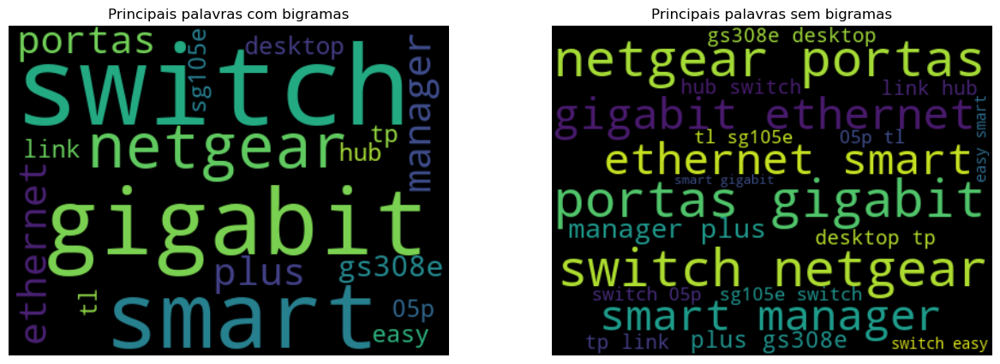

Categoria: Modem 3G/4G/WiFi


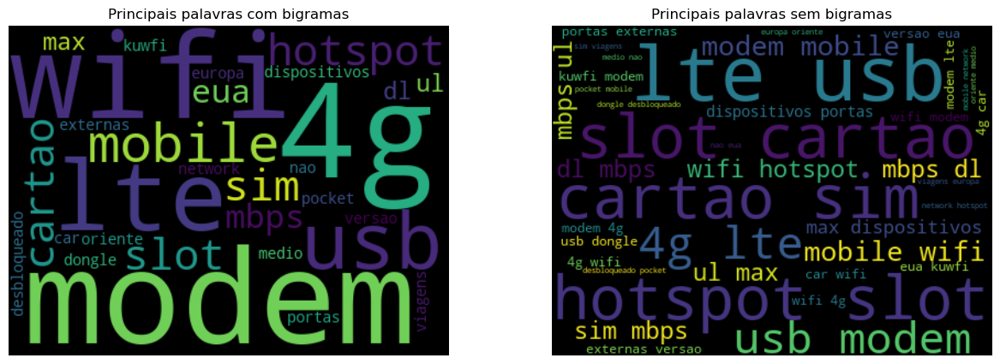

Categoria: TV Box


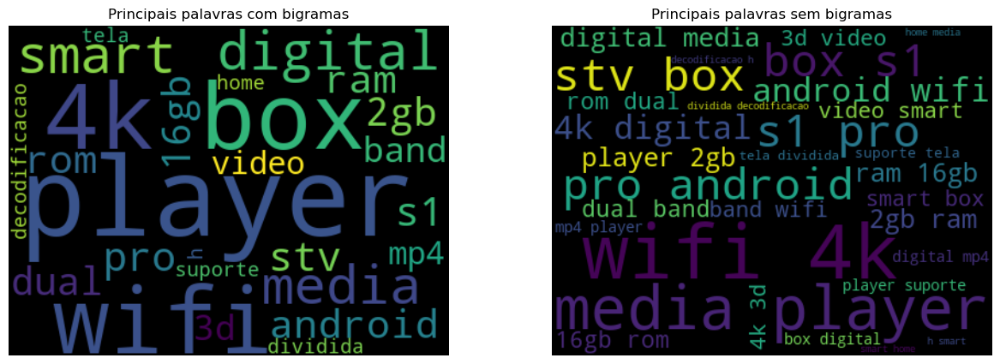

In [5]:
for target in df_cat_sample['labeled_category'].value_counts().index:
    docs_to_plot = df_cat_sample[df_cat_sample['labeled_category']==target]
    print(f'Categoria: {target}')
    plot_wordcloud(docs_to_plot['clean_doc'])

## Documentos no espaço vetorial

### Produtos de telecomunicações/produtos comuns

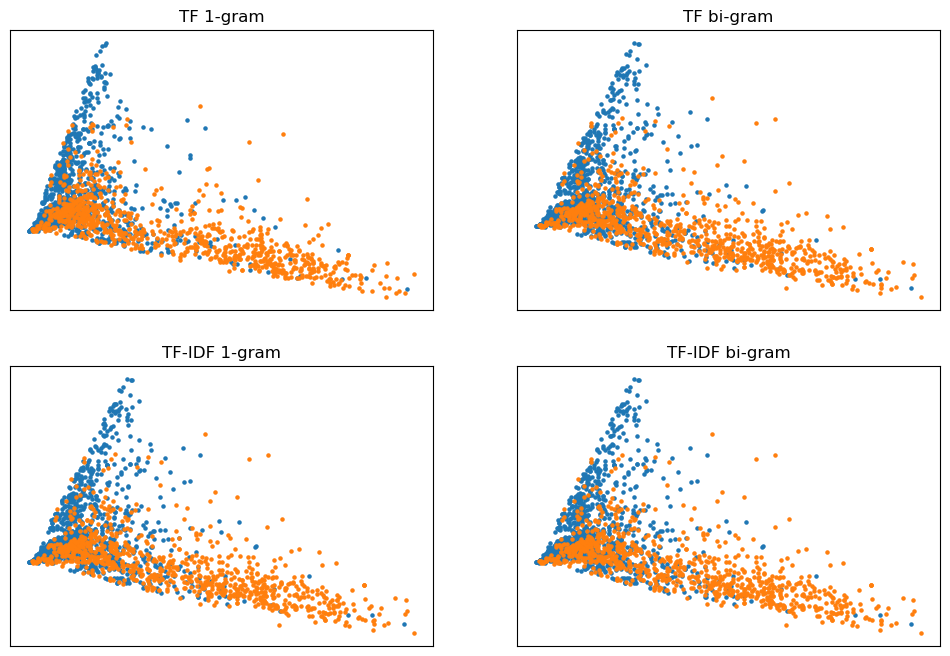

In [6]:
clean_docs = df_cat_sample['clean_doc'].to_numpy()
targets = df_cat_sample['telecom_product'].to_numpy()

fig,axs = plt.subplots(2,2,figsize=(12,8))

tf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=False)
tf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=False)

tfidf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=True)
tfidf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=True)

docs_matrix_0 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_1 = tf_vect_2.fit_transform(clean_docs)
docs_matrix_2 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_3 = tf_vect_2.fit_transform(clean_docs)

pca = TruncatedSVD(n_components=2)
pca_matrix_0 = pca.fit_transform(docs_matrix_1)
pca_matrix_1 = pca.fit_transform(docs_matrix_2)
pca_matrix_2 = pca.fit_transform(docs_matrix_2)
pca_matrix_3 = pca.fit_transform(docs_matrix_2)

scatter_x_0 = pca_matrix_0[:, 0] # first principle component
scatter_y_0 = pca_matrix_0[:, 1] # second principle component

scatter_x_1 = pca_matrix_1[:, 0] # first principle component
scatter_y_1 = pca_matrix_1[:, 1] # second principle component

scatter_x_2 = pca_matrix_2[:, 0] # first principle component
scatter_y_2 = pca_matrix_2[:, 1] # second principle component

scatter_x_3 = pca_matrix_3[:, 0] # first principle component
scatter_y_3 = pca_matrix_3[:, 1] # second principle component


for group in np.unique(targets):
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=group, s=5)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=group, s=5)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=group, s=5)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=group, s=5)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

### Categorias

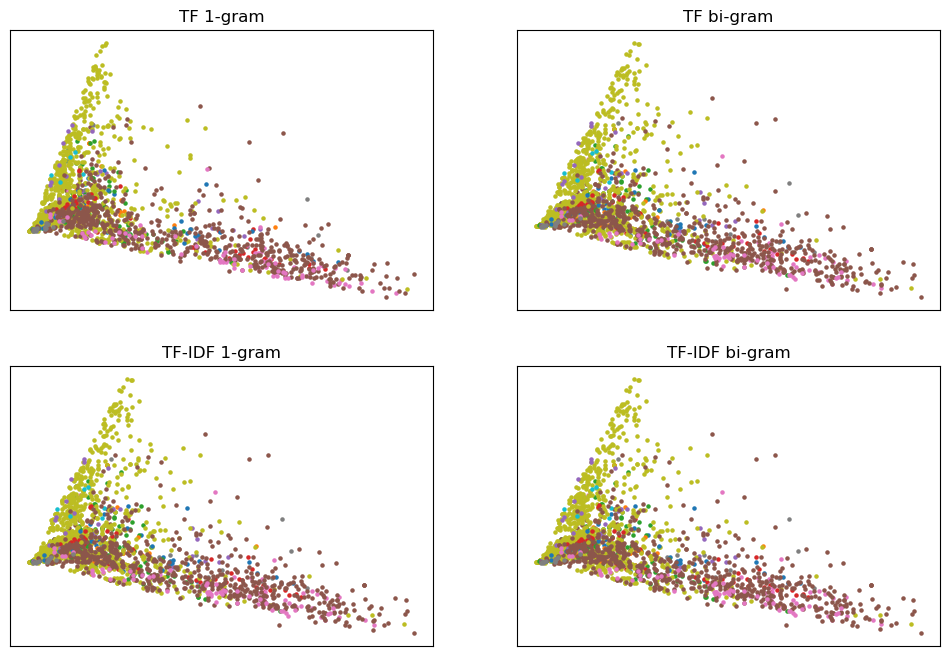

In [7]:
clean_docs = df_cat_sample['clean_doc'].to_numpy()
targets = df_cat_sample['category'].to_numpy()

fig,axs = plt.subplots(2,2,figsize=(12,8))

tf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=False)
tf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=False)

tfidf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=True)
tfidf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=True)

docs_matrix_0 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_1 = tf_vect_2.fit_transform(clean_docs)
docs_matrix_2 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_3 = tf_vect_2.fit_transform(clean_docs)

pca = TruncatedSVD(n_components=2)
pca_matrix_0 = pca.fit_transform(docs_matrix_1)
pca_matrix_1 = pca.fit_transform(docs_matrix_2)
pca_matrix_2 = pca.fit_transform(docs_matrix_2)
pca_matrix_3 = pca.fit_transform(docs_matrix_2)

scatter_x_0 = pca_matrix_0[:, 0] # first principle component
scatter_y_0 = pca_matrix_0[:, 1] # second principle component

scatter_x_1 = pca_matrix_1[:, 0] # first principle component
scatter_y_1 = pca_matrix_1[:, 1] # second principle component

scatter_x_2 = pca_matrix_2[:, 0] # first principle component
scatter_y_2 = pca_matrix_2[:, 1] # second principle component

scatter_x_3 = pca_matrix_3[:, 0] # first principle component
scatter_y_3 = pca_matrix_3[:, 1] # second principle component


for group in np.unique(targets):
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=group, s=5)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=group, s=5)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=group, s=5)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=group, s=5)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

### Categorias mais frequentes e na sequência

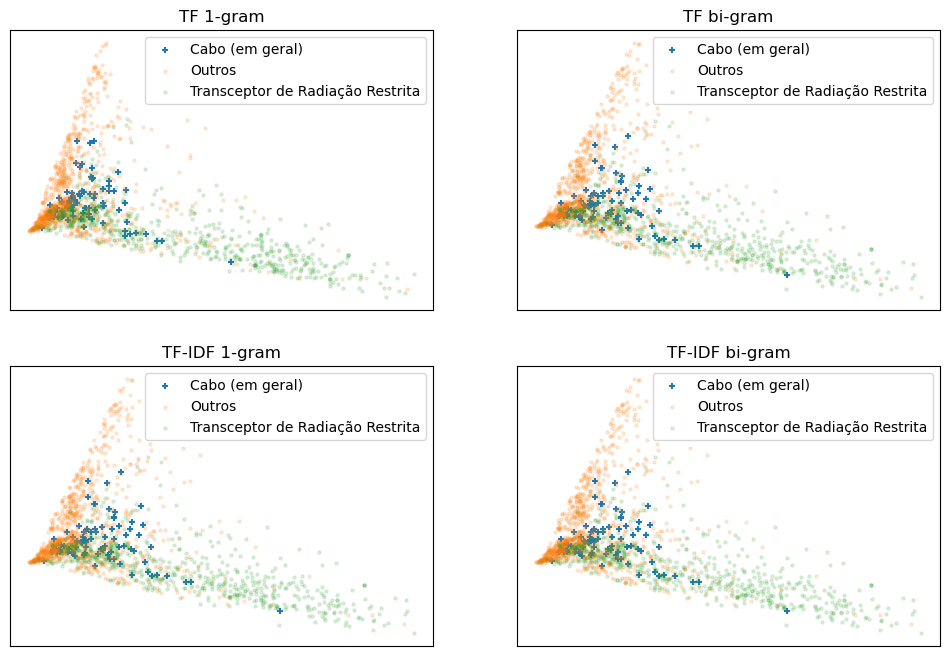

In [8]:
clean_docs = df_cat_sample['clean_doc'].to_numpy()
targets = df_cat_sample['category'].to_numpy()

tf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=False)
tf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=False)

tfidf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=True)
tfidf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=True)

docs_matrix_0 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_1 = tf_vect_2.fit_transform(clean_docs)
docs_matrix_2 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_3 = tf_vect_2.fit_transform(clean_docs)

pca = TruncatedSVD(n_components=2)
pca_matrix_0 = pca.fit_transform(docs_matrix_1)
pca_matrix_1 = pca.fit_transform(docs_matrix_2)
pca_matrix_2 = pca.fit_transform(docs_matrix_2)
pca_matrix_3 = pca.fit_transform(docs_matrix_2)

scatter_x_0 = pca_matrix_0[:, 0] # first principle component
scatter_y_0 = pca_matrix_0[:, 1] # second principle component

scatter_x_1 = pca_matrix_1[:, 0] # first principle component
scatter_y_1 = pca_matrix_1[:, 1] # second principle component

scatter_x_2 = pca_matrix_2[:, 0] # first principle component
scatter_y_2 = pca_matrix_2[:, 1] # second principle component

scatter_x_3 = pca_matrix_3[:, 0] # first principle component
scatter_y_3 = pca_matrix_3[:, 1] # second principle component


fig,axs = plt.subplots(2,2,figsize=(12,8))

for group in np.unique([18,25,2]):
    
    if group in [18,25]:
        alpha=0.15
        s=5
        marker='o'
    else:
        alpha=1
        s=20
        marker='+'
    
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()

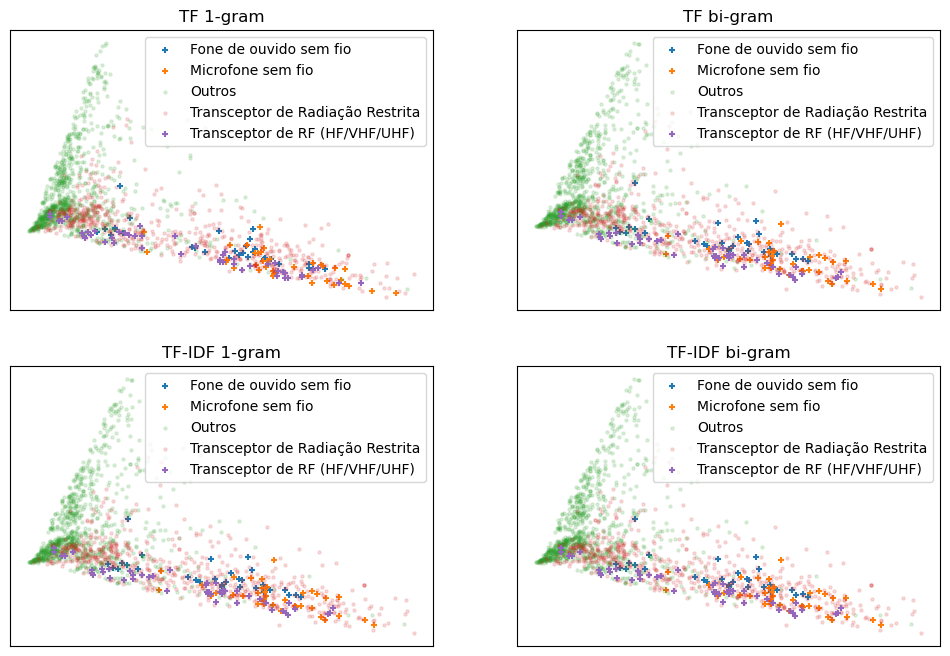

In [9]:
fig,axs = plt.subplots(2,2,figsize=(12,8))

for group in np.unique([18,25,26,16,13]):

    if group in [18,25]:
        alpha=0.15
        s=5
        marker='o'
    else:
        alpha=1
        s=20
        marker='+'
    
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()

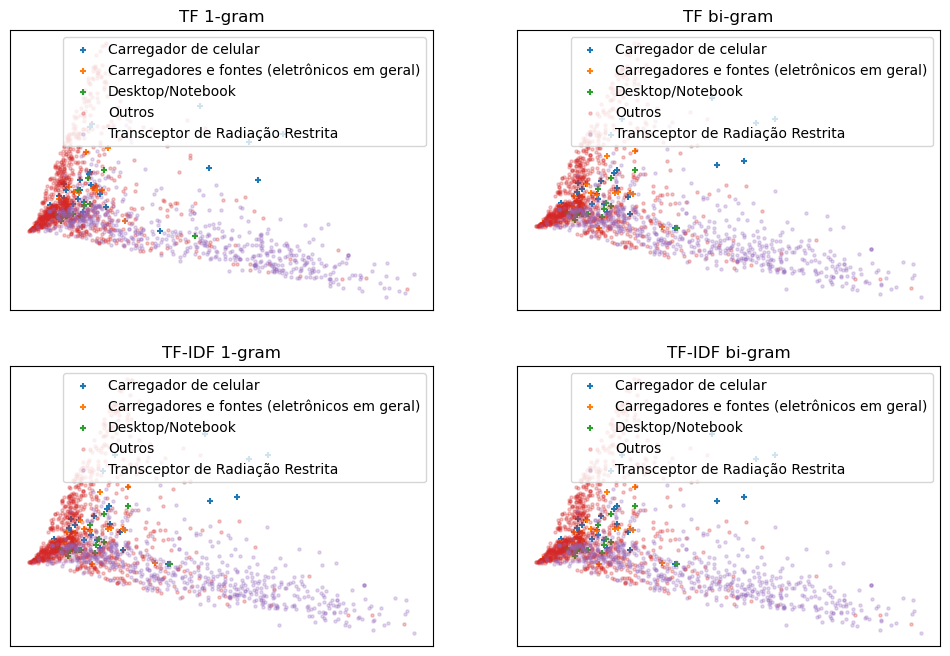

In [10]:
fig,axs = plt.subplots(2,2,figsize=(12,8))

for group in np.unique([18,25,10,8,5]):

    if group in [18,25]:
        alpha=0.25
        s=5
        marker='o'
    else:
        alpha=1
        s=20
        marker='+'
    
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()

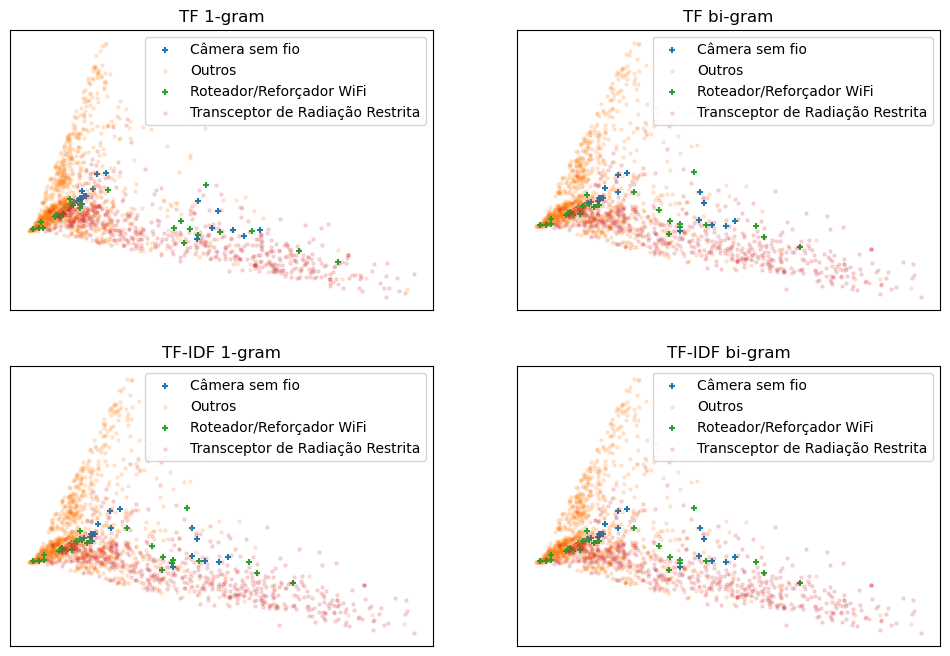

In [11]:
fig,axs = plt.subplots(2,2,figsize=(12,8))

for group in np.unique([18,25,4,20]):

    if group in [18,25]:
        alpha=0.15
        s=5
        marker='o'
    else:
        alpha=1
        s=20
        marker='+'
    
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=map_category_to_name[group], s=s, alpha=alpha, marker=marker)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()

###

### Produtos de telecomunicações/transmissores de rf/produtos comuns

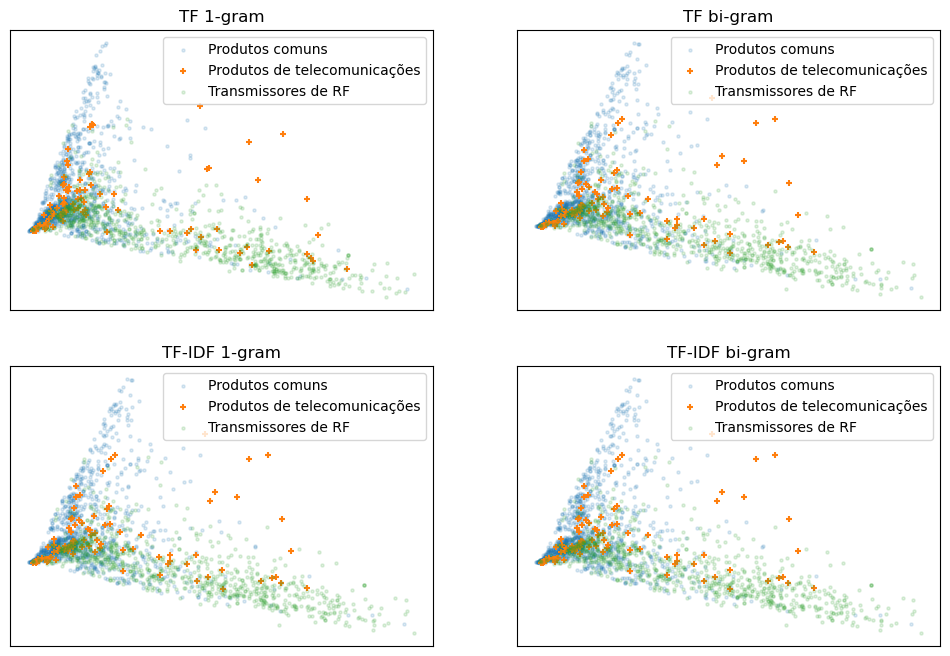

In [12]:
clean_docs = df_cat_sample['clean_doc'].to_numpy()
targets = df_cat_sample['rf_transmitter'].to_numpy()

map_groups = {0: 'Produtos comuns', 
              1: 'Produtos de telecomunicações', 
              2: 'Transmissores de RF'}

fig,axs = plt.subplots(2,2,figsize=(12,8))

tf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=False)
tf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=False)

tfidf_vect_1 = TfidfVectorizer(min_df=5,ngram_range=(1,1),use_idf=True)
tfidf_vect_2 = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=True)

docs_matrix_0 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_1 = tf_vect_2.fit_transform(clean_docs)
docs_matrix_2 = tf_vect_1.fit_transform(clean_docs)
docs_matrix_3 = tf_vect_2.fit_transform(clean_docs)

pca = TruncatedSVD(n_components=2)
pca_matrix_0 = pca.fit_transform(docs_matrix_1)
pca_matrix_1 = pca.fit_transform(docs_matrix_2)
pca_matrix_2 = pca.fit_transform(docs_matrix_2)
pca_matrix_3 = pca.fit_transform(docs_matrix_2)

scatter_x_0 = pca_matrix_0[:, 0] # first principle component
scatter_y_0 = pca_matrix_0[:, 1] # second principle component

scatter_x_1 = pca_matrix_1[:, 0] # first principle component
scatter_y_1 = pca_matrix_1[:, 1] # second principle component

scatter_x_2 = pca_matrix_2[:, 0] # first principle component
scatter_y_2 = pca_matrix_2[:, 1] # second principle component

scatter_x_3 = pca_matrix_3[:, 0] # first principle component
scatter_y_3 = pca_matrix_3[:, 1] # second principle component


for group in np.unique(targets):

    if group in [0,2]:
        alpha=0.15
        s=5
        marker='o'
    else:
        alpha=1
        s=20
        marker='+'
    
    ix = np.where(targets == group)
    axs.flat[0].scatter(scatter_x_0[ix], scatter_y_0[ix], label=map_groups[group], s=s, alpha=alpha, marker=marker)
    axs.flat[0].set_title('TF 1-gram')
    axs.flat[1].scatter(scatter_x_1[ix], scatter_y_1[ix], label=map_groups[group], s=s, alpha=alpha, marker=marker)
    axs.flat[1].set_title('TF bi-gram')
    axs.flat[2].scatter(scatter_x_2[ix], scatter_y_2[ix], label=map_groups[group], s=s, alpha=alpha, marker=marker)
    axs.flat[2].set_title('TF-IDF 1-gram')
    axs.flat[3].scatter(scatter_x_3[ix], scatter_y_3[ix], label=map_groups[group], s=s, alpha=alpha, marker=marker)
    axs.flat[3].set_title('TF-IDF bi-gram')
    
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()

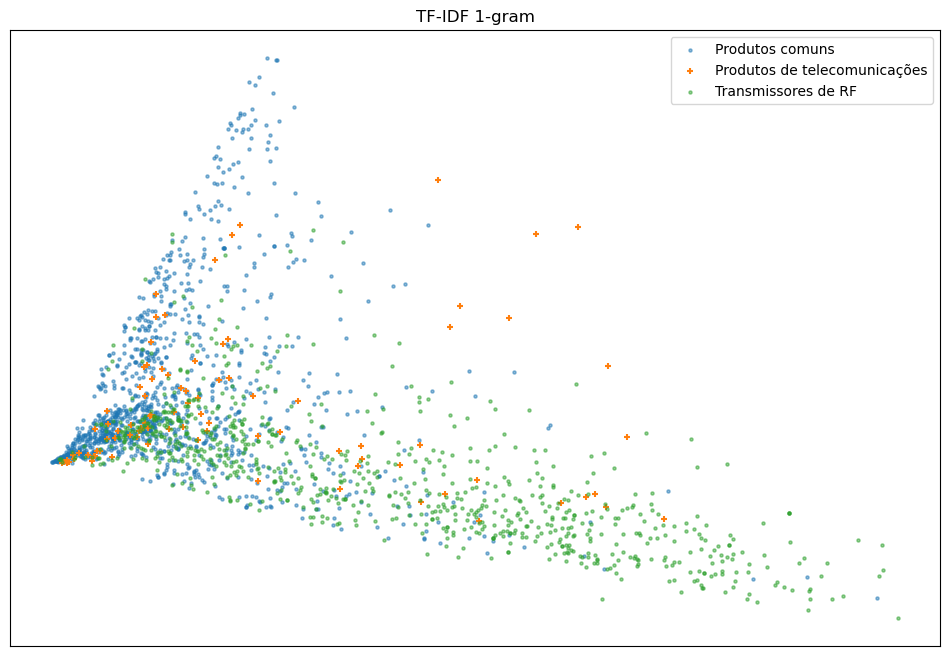

In [13]:
clean_docs = df_cat_sample['clean_doc'].to_numpy()
targets = df_cat_sample['rf_transmitter'].to_numpy()

map_groups = {0: 'Produtos comuns', 
              1: 'Produtos de telecomunicações', 
              2: 'Transmissores de RF'}

fig,ax = plt.subplots(figsize=(12,8))

for group in np.unique(targets):

    if group in [0,2]:
        alpha=0.5
        s=5
        marker='o'
    else:
        alpha=1
        s=20
        marker='+'
    
    ix = np.where(targets == group)
    ax.scatter(scatter_x_2[ix], scatter_y_2[ix], label=map_groups[group], s=s, alpha=alpha, marker=marker)
    ax.set_title('TF-IDF 1-gram')
    
ax.set_xticks([])
ax.set_yticks([])

ax.legend()

plt.show()

Categoria: Produtos comuns


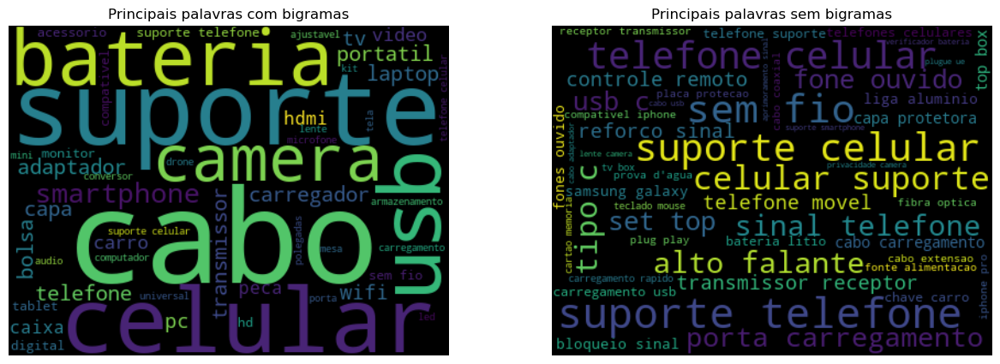

Categoria: Transmissores de RF


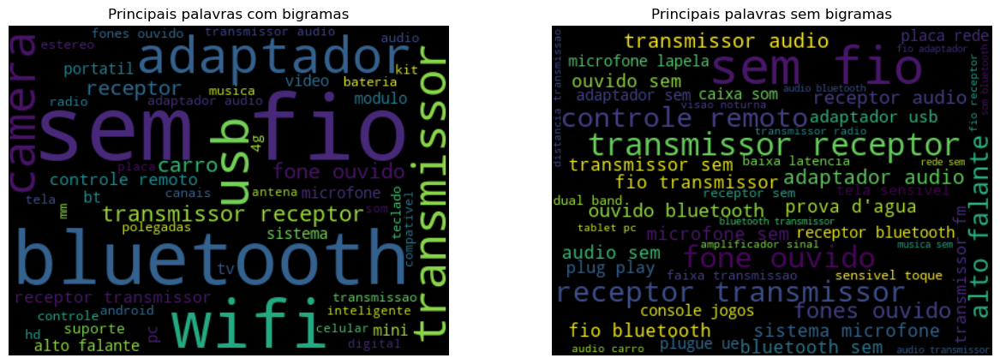

Categoria: Produtos de telecomunicações


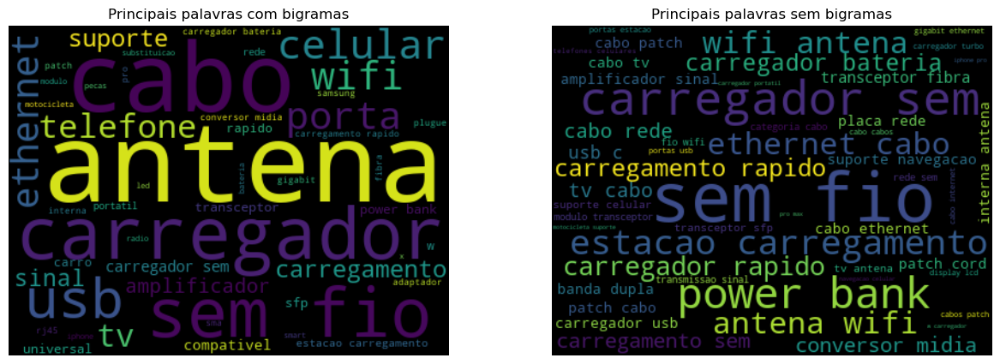

In [14]:
for target in df_cat_sample['rf_transmitter'].value_counts().index:
    docs_to_plot = df_cat_sample[df_cat_sample['rf_transmitter']==target]
    print(f'Categoria: {map_groups[target]}')
    plot_wordcloud(docs_to_plot['clean_doc'])